In [1]:
import torch
torch.cuda.is_available()

True

In [2]:
import torch
from torch.utils.data import DataLoader
import torchvision.transforms as transforms
import torchvision
import matplotlib.pyplot as plt
import numpy as np
import torch.nn as nn
import gc #Garbage collector
from tqdm import tqdm # Progress bar
import torch.nn.functional as F

In [3]:
# TAMAÑO DE LAS IMÁGENES
IMG_SIZE = (256, 256)

# DIMENSIÓN DE LA CAPA DE TEMPLATES DE LOS model_trainedS
TEMPLATE_SIZE = 256

# Se establece el número de épocas
EPOCHS = 25

# Se establece el tamaño de batch
BATCH_SIZE = 32#64

# Se establece el learning rate inicial
LEARNING_RATE = 0.0005

# Directorio que contiene la base de datos sobre la que vamos a realizar el entrenamiento
MAIN_DIR ="./Indiv/"

# Numero de clases a diferenciar en el clasificador
CLASES = 34

In [4]:
# Se engloban las transformaciones necesarias para los conjuntos de train y test
train_transform = transforms.Compose([
    transforms.Resize(IMG_SIZE),
    transforms.ToTensor(),
    # Se incluye data augmentation para prevenir el overfitting y poder conseguir unos pesos con un mayor accuracy en validación y test
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(degrees=10),
    #transforms.ColorJitter(brightness=0.4, contrast=0.4, saturation=0.4, hue=0.1),
    transforms.GaussianBlur(kernel_size=(5, 9), sigma=(0.1, 5)),
    transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5))
])
train_dataset = torchvision.datasets.ImageFolder(
    root = "./BD-461/Especificidad M/train",
    transform = train_transform
    )

train_dataloader = DataLoader(train_dataset, batch_size = BATCH_SIZE, shuffle = True, num_workers = 4)

ETIQUETAS = train_dataset.classes


In [5]:
test_transform = transforms.Compose([
    transforms.Resize(IMG_SIZE),
    transforms.ToTensor(),
])

test_dataset = torchvision.datasets.ImageFolder(
    root = MAIN_DIR,
    transform=test_transform
    )

test_dataloader = DataLoader(test_dataset, batch_size = 25, shuffle = False, num_workers = 4)

In [6]:
device = ('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Training on device {device}.")

Training on device cuda.


In [7]:
modelo = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_resnet50', pretrained=True)
modelo.fc = nn.Linear(modelo.fc.in_features, CLASES)
pesos = torch.load('./models/resnet50-EspecificidadM.pt',map_location='cuda')
modelo.load_state_dict(pesos)
modelo.to(device)
modelo.eval()
#model_trained.eval()

Using cache found in /home/andres/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub
/home/andres/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/common.py:13: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(
/home/andres/.cache/torch/hub/NVIDIA_DeepLearningExamples_torchhub/PyTorch/Classification/ConvNets/image_classification/models/efficientnet.py:17: UserWarning: pytorch_quantization module not found, quantization will not be available
  warnings.warn(


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layers): Sequential(
    (0): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
          (0): Conv2d

In [8]:
subset_images = []
subset_labels_pred = []
predicted_labels = []
num_images_to_display = 25
prob = []

with torch.no_grad():
    for images, labels in test_dataloader:
        images = images.to(device)
        labels = labels.to(device)
        
        outputs = modelo(images)
        probs = F.softmax(outputs,dim=1)
        for p in probs.topk(1)[0]:
            prob.append(p.detach().cpu().numpy()[0])

        _, predicted = torch.max(outputs.data, 1)
        
        predicted_labels.extend(predicted.cpu().numpy())

        # Se obtiene un subconjunto de imágenes para mostrar junto a sus etiquetas
        subset_images.extend(images[:num_images_to_display].cpu())
        subset_labels_pred.extend(predicted[:num_images_to_display].cpu().numpy())

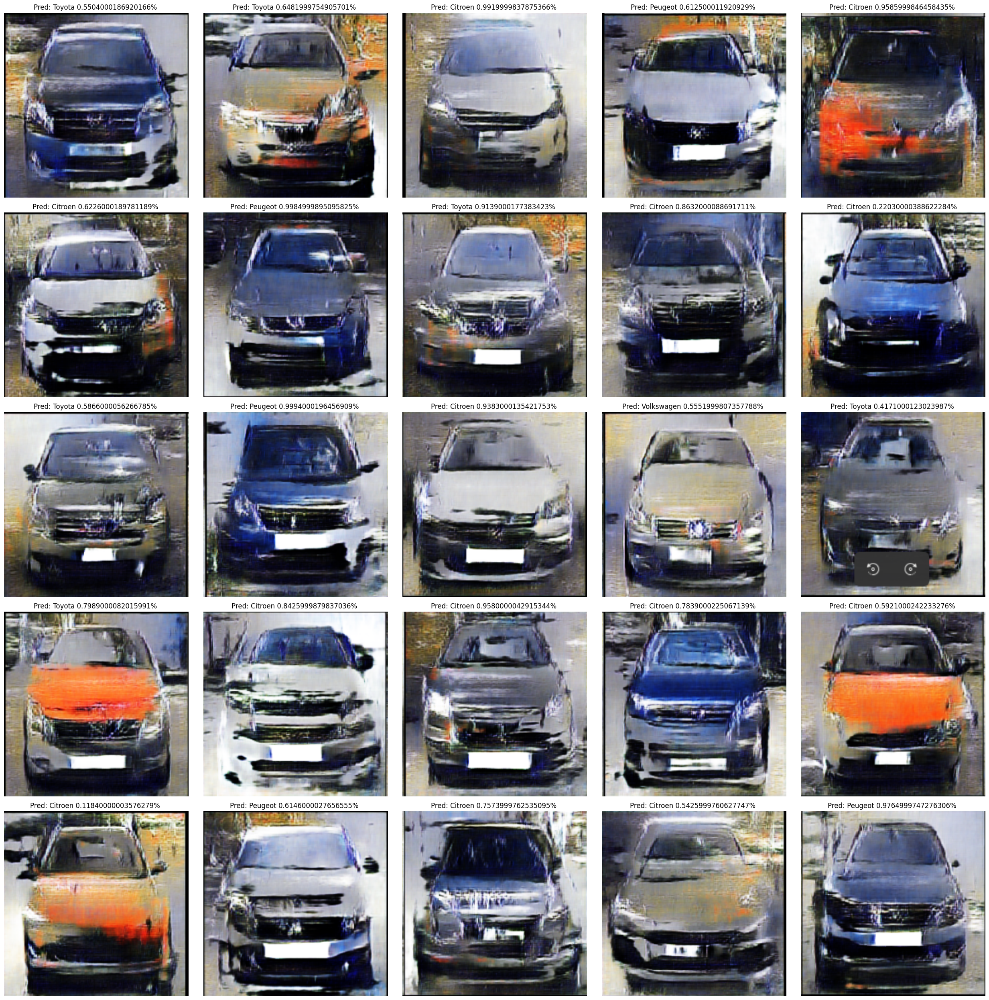

In [9]:
# Mostrar las imágenes junto con las etiquetas reales y predichas
fig, axs = plt.subplots(5, 5, figsize=(25, 25))

for i in range(num_images_to_display):
    image = subset_images[i]
    label_pred = ETIQUETAS[subset_labels_pred[i]]
    
    image = np.transpose(image, (1, 2, 0))
    image = np.clip(image, 0, 1)  # Ajustar los valores de píxel al rango [0, 1]
    
    axs[i % 5, i // 5].imshow(image)
    axs[i % 5, i // 5].axis('off')
    axs[i % 5, i // 5].set_title(f'Pred: {label_pred} {round(prob[i],4)}% ')

plt.tight_layout()
plt.show()